In [1]:
# !pip install tensorflow==2.11.0 opencv-python numpy albumentations matplotlib

python version 3.10.11

In [2]:
!pip show keras

Name: keras
Version: 2.11.0
Summary: Deep learning for humans.
Home-page: https://keras.io/
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache 2.0
Location: e:\wall_segmentation_project\.venv\lib\site-packages
Requires: 
Required-by: tensorflow-intel


In [3]:
import tensorflow as tf
print(tf.__version__)

2.11.0


In [4]:
import tensorflow as tf
from tensorflow.keras.utils import to_categorical, register_keras_serializable
print("TensorFlow version:", tf.__version__)
print("Keras imports successful!")

TensorFlow version: 2.11.0
Keras imports successful!


In [5]:
import os
import cv2
import json
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical, register_keras_serializable
from tensorflow.keras.layers import (Input, Conv2D, UpSampling2D, BatchNormalization, 
                                     Conv2DTranspose, Activation, Multiply, Concatenate, Add)
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras import backend as K
import albumentations as A
import matplotlib.pyplot as plt

# Test the imports
print("TensorFlow version:", tf.__version__)
print("All imports successful!")

e:\Wall_Segmentation_project\.venv\lib\site-packages\albumentations\__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


TensorFlow version: 2.11.0
All imports successful!


In [6]:
import os
import cv2
import json
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical, register_keras_serializable
from tensorflow.keras.layers import (Input, Conv2D, UpSampling2D, BatchNormalization, 
                                     Conv2DTranspose, Activation, Multiply, Concatenate, Add)
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras import backend as K
import albumentations as A
import matplotlib.pyplot as plt

In [7]:
# Define paths to data directories
train_images_dir = 'E:\\Wall_Segmentation_project\\Annotated_Dataset - Copy\\train\\images'
train_annotations_dir = 'E:\\Wall_Segmentation_project\\Annotated_Dataset - Copy\\train\\annotations'
train_masks_dir = 'E:\\Wall_Segmentation_project\\Annotated_Dataset - Copy\\train\\masks'  # New masks folder
val_images_dir = 'E:\\Wall_Segmentation_project\\Annotated_Dataset - Copy\\validation\\images'
val_annotations_dir = 'E:\\Wall_Segmentation_project\\Annotated_Dataset - Copy\\validation\\annotations'
val_masks_dir = 'E:\\Wall_Segmentation_project\\Annotated_Dataset - Copy\\validation\\masks'  # New masks folder
# Create masks directories if they don't exist
os.makedirs(train_masks_dir, exist_ok=True)
os.makedirs(val_masks_dir, exist_ok=True)

In [8]:
def load_mask_from_json(mask_json_path, height, width):
    with open(mask_json_path, 'r') as f:
        mask_data = json.load(f)
    mask = np.zeros((height, width), dtype=np.uint8)
    for shape in mask_data.get('shapes', []):
        label = shape.get('label', '').lower()
        points = np.array(shape.get('points', []), dtype=np.int32)
        if label == 'wall':
            color = 1
        elif label == 'ceiling':
            color = 2
        else:
            color = 0
        if len(points.shape) == 1:
            points = points.reshape((-1, 2))
        cv2.fillPoly(mask, [points], color=color)
    return mask

def create_mask_png(mask_json_path, mask_output_path, height, width):
    mask = load_mask_from_json(mask_json_path, height, width)
    cv2.imwrite(mask_output_path, mask)

def generate_masks(images_dir, annotations_dir, masks_dir):
    image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    for img_file in image_files:
        img_base = os.path.splitext(img_file)[0]
        mask_json_path = os.path.join(annotations_dir, img_base + '.json')
        mask_output_path = os.path.join(masks_dir, img_base + '.png')
        img_path = os.path.join(images_dir, img_file)
        image = cv2.imread(img_path)
        if image is None:
            print(f"Warning: Image {img_path} could not be read. Skipping.")
            continue
        height, width = image.shape[:2]
        if not os.path.exists(mask_json_path):
            print(f"Warning: Annotation JSON {mask_json_path} not found. Skipping.")
            continue
        create_mask_png(mask_json_path, mask_output_path, height, width)
    print(f"Mask generation for {images_dir} completed.")

generate_masks(train_images_dir, train_annotations_dir, train_masks_dir)
generate_masks(val_images_dir, val_annotations_dir, val_masks_dir)

Mask generation for E:\Wall_Segmentation_project\Annotated_Dataset - Copy\train\images completed.
Mask generation for E:\Wall_Segmentation_project\Annotated_Dataset - Copy\validation\images completed.


In [9]:


def augment_data(image_path, mask_path, output_image_path, output_mask_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not read image {image_path}")
        return
    height, width = image.shape[:2]
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        print(f"Error: Could not read mask {mask_path}")
        return
    transform = A.Compose([
        A.RandomBrightnessContrast(p=0.5),
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
        A.GaussianBlur(blur_limit=(3, 7), p=0.3),
        A.HorizontalFlip(p=0.5),
        A.Affine(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.7),
        A.RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0), p=0.5), # Changed to 224x224
        A.CoarseDropout(max_holes=8, max_height=32, max_width=32, p=0.4)
    ])
    augmented = transform(image=image, mask=mask)
    cv2.imwrite(output_image_path, augmented['image'])
    cv2.imwrite(output_mask_path, augmented['mask'])

def augment_dataset(images_dir, masks_dir, output_dir):
    augmented_images_dir = os.path.join(output_dir, 'images')
    augmented_masks_dir = os.path.join(output_dir, 'masks')
    os.makedirs(augmented_images_dir, exist_ok=True)
    os.makedirs(augmented_masks_dir, exist_ok=True)
    image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    for img_file in image_files:
        image_path = os.path.join(images_dir, img_file)
        mask_path = os.path.join(masks_dir, os.path.splitext(img_file)[0] + '.png')
        output_image_path = os.path.join(augmented_images_dir, img_file)
        output_mask_path = os.path.join(augmented_masks_dir, os.path.splitext(img_file)[0] + '.png')
        if not os.path.exists(mask_path):
            print(f"Warning: Mask PNG {mask_path} not found. Skipping augmentation for {img_file}.")
            continue
        augment_data(image_path, mask_path, output_image_path, output_mask_path)
    print("Data augmentation completed and saved.")

augment_dataset(train_images_dir, train_masks_dir, os.path.join(train_images_dir, 'augmented'))

C:\Users\Bilal Saif\AppData\Local\Temp\ipykernel_17616\4095574557.py:16: UserWarning: Argument(s) 'shift_limit, scale_limit, rotate_limit' are not valid for transform Affine
  A.Affine(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.7),
C:\Users\Bilal Saif\AppData\Local\Temp\ipykernel_17616\4095574557.py:18: UserWarning: Argument(s) 'max_holes, max_height, max_width' are not valid for transform CoarseDropout
  A.CoarseDropout(max_holes=8, max_height=32, max_width=32, p=0.4)


Data augmentation completed and saved.


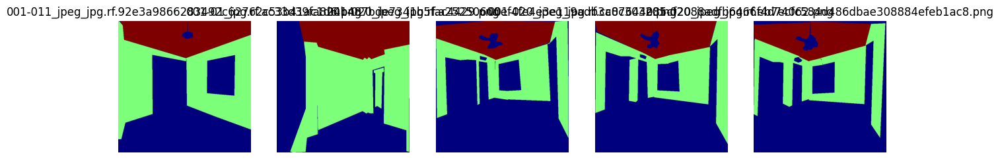

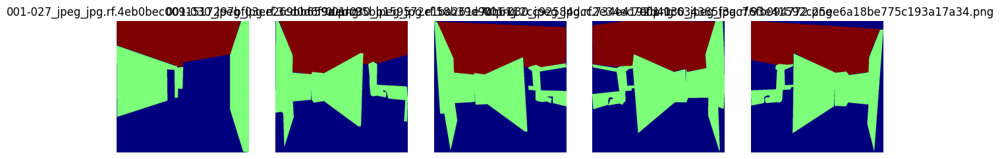

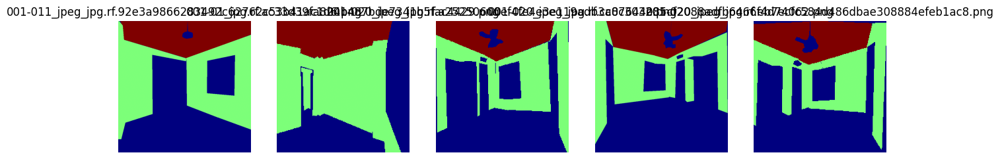

In [10]:
import matplotlib.pyplot as plt
def visualize_masks(masks_dir, num_samples=5):
    mask_files = [f for f in os.listdir(masks_dir) if f.lower().endswith('.png')]
    plt.figure(figsize=(15, 5))
    for i, mask_file in enumerate(mask_files[:num_samples]):
        mask_path = os.path.join(masks_dir, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            print(f"Could not load mask {mask_file}")
            continue
        plt.subplot(1, num_samples, i+1)
        plt.imshow(mask, cmap='jet')
        plt.title(mask_file)
        plt.axis('off')
    plt.show()

# Visualize some training masks
visualize_masks(train_masks_dir)

# Visualize some validation masks
visualize_masks(val_masks_dir)

# Visualize some augmented masks
augmented_train_masks_dir = os.path.join(train_images_dir, 'augmented', 'masks')
visualize_masks(augmented_train_masks_dir)

In [11]:
# import tensorflow as tf
# from tensorflow.keras.models import Model
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.optimizers.schedules import ExponentialDecay
# from tensorflow.keras.applications import MobileNetV2
# from tensorflow.keras.layers import (
#     Input, Conv2D, BatchNormalization, Dropout,
#     UpSampling2D, GlobalAveragePooling2D, Reshape, Lambda
# )
# from tensorflow.keras import regularizers

# def create_deeplabv3_model(input_shape, num_classes):
#     # Backbone
#     base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
#     base_output = base_model.get_layer('block_13_expand_relu').output

#     # ASPP
#     atrous1 = Conv2D(256, (3, 3), padding='same', dilation_rate=6, activation='relu')(base_output)
#     atrous1 = BatchNormalization()(atrous1)

#     atrous2 = Conv2D(256, (3, 3), padding='same', dilation_rate=12, activation='relu')(base_output)
#     atrous2 = BatchNormalization()(atrous2)

#     atrous3 = Conv2D(256, (3, 3), padding='same', dilation_rate=18, activation='relu')(base_output)
#     atrous3 = BatchNormalization()(atrous3)

#     atrous_pool = GlobalAveragePooling2D()(base_output)
#     atrous_pool = Reshape((1, 1, base_output.shape[-1]))(atrous_pool)
#     atrous_pool = Conv2D(256, (1, 1), padding='same', activation='relu')(atrous_pool)
#     atrous_pool_resized = UpSampling2D(size=(16, 16), interpolation='bilinear')(atrous_pool)

#     # Using Lambda layer to add tensors element-wise
#     def add_tensors(*tensors):
#         return tf.add_n(tensors)  # This will add all tensors in the list

#     # Element-wise addition using Lambda layer
#     x = Lambda(add_tensors)([atrous1, atrous2, atrous3, atrous_pool_resized])

#     # Ensure the output is of shape (batch, height, width, channels)
#     # Remove the extra dimension that is causing the mismatch
#     x = Reshape((16, 16, 256))(x)  # Adjust this reshape to match the expected input shape for the next layer

#     # Post-ASPP Layers
#     x = Conv2D(256, (1, 1), padding='same', activation='relu')(x)
#     x = BatchNormalization()(x)
#     x = Dropout(0.4)(x)

#     # Upsample to input resolution
#     x = UpSampling2D(size=(4, 4), interpolation='bilinear')(x)
#     x = UpSampling2D(size=(2, 2), interpolation='bilinear')(x)
#     x = UpSampling2D(size=(2, 2), interpolation='bilinear')(x)

#     # Final classification layer
#     x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
#     x = Conv2D(num_classes, (1, 1), padding='same', activation='softmax')(x)

#     return Model(inputs=base_model.input, outputs=x)

# # Model creation and compilation
# input_shape = (256, 256, 3)
# num_classes = 3

# lr_schedule = ExponentialDecay(0.0001, decay_steps=10000, decay_rate=0.96, staircase=True)
# model = create_deeplabv3_model(input_shape, num_classes)

# for layer in model.layers:
#     if hasattr(layer, 'kernel_regularizer'):
#         kernel_regularizer = regularizers.L2(0.01)  # Directly use L2

# model.compile(optimizer=Adam(learning_rate=lr_schedule), loss='categorical_crossentropy', metrics=['accuracy'])

# # Summary of the model architecture
# model.summary()


In [12]:
!pip show tensorflow keras segmentation-models


Name: tensorflow
Version: 2.11.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: e:\wall_segmentation_project\.venv\lib\site-packages
Requires: tensorflow-intel
Required-by: 
---
Name: keras
Version: 2.11.0
Summary: Deep learning for humans.
Home-page: https://keras.io/
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache 2.0
Location: e:\wall_segmentation_project\.venv\lib\site-packages
Requires: 
Required-by: tensorflow-intel


In [13]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import (Conv2D, UpSampling2D, BatchNormalization, 
                                     Conv2DTranspose, Activation, Multiply, Concatenate, 
                                     SpatialDropout2D, Add)
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam  # Changed to Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay

# Custom SpatialDropout2D for TFLite compatibility
@register_keras_serializable()
class SpatialDropout2D(tf.keras.layers.Layer):
    def __init__(self, rate, **kwargs):
        super(SpatialDropout2D, self).__init__(**kwargs)
        self.rate = rate

    def call(self, inputs, training=None):
        if training:
            return tf.nn.dropout(inputs, rate=self.rate, noise_shape=[tf.shape(inputs)[0], 1, 1, tf.shape(inputs)[3]])
        return inputs

    def get_config(self):
        config = super(SpatialDropout2D, self).get_config()
        config.update({'rate': self.rate})
        return config

# Model definition
def create_improved_deeplabv3_model(input_shape, num_classes):
    base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
    low_level_features = base_model.get_layer('block_3_expand_relu').output  # (None, 56, 56, 144)
    mid_level_features = base_model.get_layer('block_6_expand_relu').output  # (None, 28, 28, 192)
    high_level_features = base_model.get_layer('block_13_expand_relu').output  # (None, 14, 14, 576)

    def enhanced_aspp(input_tensor):
        atrous = [
            Conv2D(128, (3, 3), dilation_rate=6, padding='same', activation='relu', kernel_regularizer=l2(0.001))(input_tensor), # Reduced filters to 128
            Conv2D(128, (3, 3), dilation_rate=12, padding='same', activation='relu', kernel_regularizer=l2(0.001))(input_tensor),
            Conv2D(128, (1, 1), padding='same', activation='relu', kernel_regularizer=l2(0.001))(input_tensor) # Removed dilation=18
        ]
        return Concatenate()([*atrous])  # (None, 14, 14, 384)

    def boundary_refinement(input_tensor):
        edge = Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.001))(input_tensor) # Reduced filters to 64
        edge = BatchNormalization()(edge)
        edge = Conv2D(1, (3, 3), padding='same', activation='sigmoid')(edge) # Simplified edge detection
        
        x = Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.001))(input_tensor)
        x = BatchNormalization()(x)
        x = Multiply()([x, edge])
        
        adjusted_input = Conv2D(64, (1, 1), padding='same', kernel_regularizer=l2(0.001))(input_tensor)
        adjusted_input = BatchNormalization()(adjusted_input)
        return Add()([adjusted_input, x])

    x = enhanced_aspp(high_level_features)
    x = Conv2DTranspose(64, (3, 3), strides=2, padding='same')(x) # Reduced filters to 64
    x = Concatenate()([x, mid_level_features])
    x = boundary_refinement(x)

    x = Conv2DTranspose(32, (3, 3), strides=2, padding='same')(x) # Reduced filters to 32
    x = Concatenate()([x, low_level_features])
    x = boundary_refinement(x)

    x = Conv2D(32, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Conv2D(num_classes, (1, 1))(x)
    x = UpSampling2D(size=(4, 4), interpolation='bilinear')(x)

    output = Activation('softmax')(x) # Simplified: removed redundant edge branch

    return Model(inputs=base_model.input, outputs=output)

# Model Creation and Compilation
input_shape = (224, 224, 3) # Changed to 224x224
num_classes = 3
model = create_improved_deeplabv3_model(input_shape, num_classes)
for layer in model.layers:
    if hasattr(layer, 'kernel_regularizer'):
        layer.kernel_regularizer = l2(0.01)


In [14]:
# import os
# import cv2
# import numpy as np
# from tensorflow.keras.preprocessing.image import load_img, img_to_array  # Fixed import
# from tensorflow.keras.utils import to_categorical  # Fixed import
# Data generator
def data_generator(images_dir, masks_dir, batch_size, img_size, num_classes):
    image_filenames = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    mask_filenames = {os.path.splitext(f)[0]: f for f in os.listdir(masks_dir) if f.lower().endswith('.png')}
    
    while True:
        batch_images = []
        batch_masks = []
        for img_file in image_filenames:
            img_base = os.path.splitext(img_file)[0]
            mask_file = mask_filenames.get(img_base, None)
            if mask_file is None:
                print(f"Warning: Mask for {img_file} not found. Skipping this image.")
                continue
            img_path = os.path.join(images_dir, img_file)
            mask_path = os.path.join(masks_dir, mask_file)
            try:
                image = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                image = tf.keras.preprocessing.image.img_to_array(image) / 255.0
                batch_images.append(image)
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
                continue
            try:
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                if mask is None:
                    print(f"Warning: Mask {mask_path} could not be loaded. Skipping this image.")
                    batch_images.pop()
                    continue
                mask = cv2.resize(mask, (img_size[1], img_size[0]), interpolation=cv2.INTER_NEAREST)
                one_hot_mask = to_categorical(mask, num_classes=num_classes)
                batch_masks.append(one_hot_mask)
            except Exception as e:
                print(f"Error loading mask {mask_path}: {e}")
                batch_images.pop()
                continue
            if len(batch_images) == batch_size:
                yield np.array(batch_images), np.array(batch_masks)
                batch_images = []
                batch_masks = []
        if len(batch_images) > 0 and len(batch_images) == len(batch_masks):
            yield np.array(batch_images), np.array(batch_masks)


In [15]:
# Define calculate_steps function
def calculate_steps(images_dir, batch_size):
    image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    return max(1, len(image_files) // batch_size)

batch_size = 8
img_size = (224, 224) # Changed to 224x224
train_aug_images_dir = os.path.join(train_images_dir, 'augmented', 'images')
train_aug_masks_dir = os.path.join(train_images_dir, 'augmented', 'masks')

train_gen = data_generator(train_aug_images_dir, train_aug_masks_dir, batch_size, img_size, num_classes)
val_gen = data_generator(val_images_dir, val_masks_dir, batch_size, img_size, num_classes)

train_steps = calculate_steps(train_aug_images_dir, batch_size)
val_steps = calculate_steps(val_images_dir, batch_size)
print(f"Training steps per epoch: {train_steps}")
print(f"Validation steps per epoch: {val_steps}")

# Custom loss functions
@register_keras_serializable()
def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

@register_keras_serializable()
def focal_loss(y_true, y_pred, gamma=2.5, alpha=0.25):
    epsilon = K.epsilon()
    y_pred = K.clip(y_pred, epsilon, 1.0 - epsilon)
    loss = -y_true * alpha * K.pow((1 - y_pred), gamma) * K.log(y_pred) - (1 - y_true) * (1 - alpha) * K.pow(y_pred, gamma) * K.log(1 - y_pred)
    return K.mean(loss)

@register_keras_serializable()
def iou_loss(y_true, y_pred):
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1, 2, 3])
    union = K.sum(y_true, axis=[1, 2, 3]) + K.sum(y_pred, axis=[1, 2, 3]) - intersection
    return 1 - K.mean((intersection + 1e-7) / (union + 1e-7))

@register_keras_serializable()
def combined_loss(y_true, y_pred):
    return 0.4 * iou_loss(y_true, y_pred) + 0.4 * dice_loss(y_true, y_pred) + 0.2 * focal_loss(y_true, y_pred)

# Training
lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-3,
    decay_steps=train_steps * 100,
    alpha=1e-6
)
optimizer = Adam(learning_rate=lr_schedule)
model.compile(optimizer=optimizer, loss=combined_loss, metrics=['accuracy', MeanIoU(num_classes=num_classes, name='iou')])

callbacks = [
    ModelCheckpoint('Final_Wall_Model_1.0.keras', save_best_only=True, monitor='val_iou', mode='max'),
    EarlyStopping(monitor='val_iou', patience=15, restore_best_weights=True, mode='max'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1, mode='min'),
    TensorBoard(log_dir='./logs', histogram_freq=1)
]

history = model.fit(
    train_gen,
    steps_per_epoch=train_steps,
    validation_data=val_gen,
    validation_steps=val_steps,
    epochs=40,
    callbacks=callbacks
)

# Save in SavedModel format for TFLite
model.save('Final_Wall_Model_2.0', save_format='tf')


Training steps per epoch: 596
Validation steps per epoch: 28
Epoch 1/40
596/596 [==============================] - 784s 1s/step - loss: 0.3049 - accuracy: 0.8504 - iou: 0.3494 - val_loss: 0.7399 - val_accuracy: 0.3670 - val_iou: 0.3341 - lr: 9.9975e-04
Epoch 2/40
596/596 [==============================] - 735s 1s/step - loss: 0.1867 - accuracy: 0.8750 - iou: 0.3389 - val_loss: 0.3156 - val_accuracy: 0.7636 - val_iou: 0.3337 - lr: 9.9902e-04
Epoch 3/40
596/596 [==============================] - 723s 1s/step - loss: 0.1703 - accuracy: 0.8849 - iou: 0.3359 - val_loss: 0.2455 - val_accuracy: 0.8233 - val_iou: 0.3334 - lr: 9.9778e-04
Epoch 4/40
596/596 [==============================] - 724s 1s/step - loss: 0.1619 - accuracy: 0.8911 - iou: 0.3378 - val_loss: 0.2279 - val_accuracy: 0.8344 - val_iou: 0.3333 - lr: 9.9606e-04
Epoch 5/40
596/596 [==============================] - 724s 1s/step - loss: 0.1531 - accuracy: 0.8972 - iou: 0.3367 - val_loss: 0.1786 - val_accuracy: 0.8755 - val_iou: 0.3

INFO:tensorflow:Assets written to: Final_Wall_Model_2.0\assets


INFO:tensorflow:Assets written to: Final_Wall_Model_2.0\assets


#### Conditional Random Fields (CRFs):

Apply CRFs as a post-processing step to refine segmentation masks.
CRFs adjust segmentation by aligning it better with object boundaries using image pixel intensities.
Use libraries like pydensecrf for integration

In [16]:
 
# import numpy as np
# import pydensecrf.densecrf as dcrf
# from pydensecrf.utils import unary_from_softmax, create_pairwise_gaussian, create_pairwise_bilateral

# def apply_crf(image, predicted_mask):
#     # Ensure predicted_mask is a softmax probability map
#     softmax_probs = predicted_mask / np.sum(predicted_mask, axis=-1, keepdims=True)

#     # Initialize CRF
#     d = dcrf.DenseCRF2D(image.shape[1], image.shape[0], softmax_probs.shape[-1])  # H, W, Classes

#     # Set unary potential
#     unary = unary_from_softmax(softmax_probs)
#     d.setUnaryEnergy(unary)

#     # Add pairwise Gaussian potentials
#     pairwise_gaussian = create_pairwise_gaussian(sdims=(3, 3), shape=image.shape[:2])
#     d.addPairwiseEnergy(pairwise_gaussian, compat=3)

#     # Add pairwise bilateral potentials+
#     pairwise_bilateral = create_pairwise_bilateral(sdims=(50, 50), schan=(20, 20, 20), img=image, chdim=2)
#     d.addPairwiseEnergy(pairwise_bilateral, compat=10)

#     # Perform inference
#     refined_mask = d.inference(10)
#     return np.argmax(refined_mask, axis=0)

In [17]:
# # Evaluate and visualize
# evaluation_results = model.evaluate(val_gen, steps=calculate_steps(val_images_dir, batch_size))

# # Assuming the model was compiled with 'loss' and 'accuracy' metrics
# val_loss = evaluation_results[0]
# val_acc = evaluation_results[1]
# print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_acc}")

# # Plot training history
# import matplotlib.pyplot as plt
# plt.figure(figsize=(12, 6))
# plt.plot(history.history['accuracy'], label='Train Accuracy')
# plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
# plt.plot(history.history['loss'], label='Train Loss')
# plt.plot(history.history['val_loss'], label='Validation Loss')
# plt.legend()
# plt.title('Training Progress')
# plt.xlabel('Epochs')
# plt.ylabel('Metrics')
# plt.grid(True)
# plt.show()


28/28 [==============================] - 8s 298ms/step - loss: 0.1664 - accuracy: 0.8862 - iou: 0.3350
Validation Loss: 0.16636048257350922, Validation Accuracy: 0.8861690163612366, Validation IoU: 0.3349883556365967


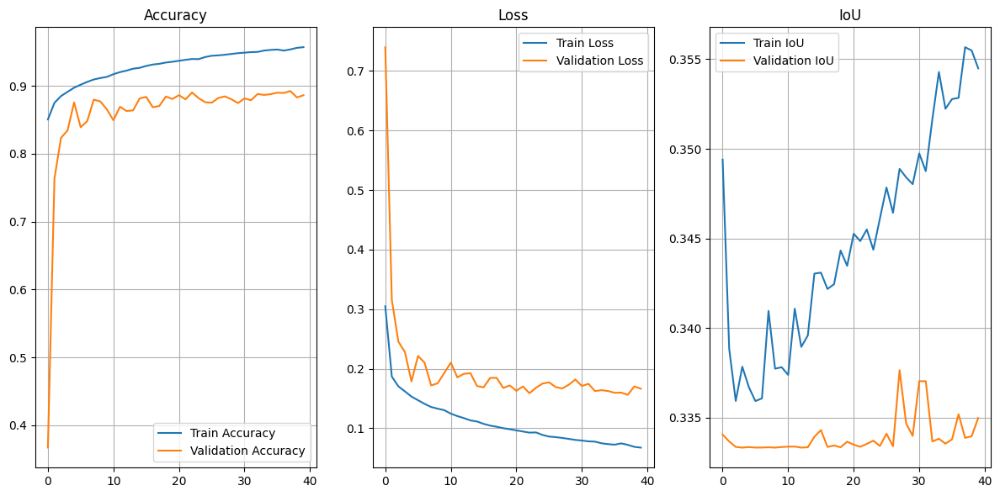

In [18]:
# Evaluate and Visualize
evaluation_results = model.evaluate(val_gen, steps=val_steps)
val_loss, val_acc, val_iou = evaluation_results[0], evaluation_results[1], evaluation_results[2]
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_acc}, Validation IoU: {val_iou}")

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss')
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(history.history['iou'], label='Train IoU')
plt.plot(history.history['val_iou'], label='Validation IoU')
plt.legend()
plt.title('IoU')
plt.grid(True)

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 43ms/step


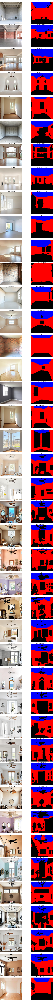

In [22]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

# Function to preprocess the input image to the correct shape
def preprocess_image(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    image = image / 255.0  # Normalize the image
    return np.expand_dims(image, axis=0)  # Add batch dimension

# Function to visualize model predictions
def visualize_model_output(image_paths):
    num_images = len(image_paths)
    plt.figure(figsize=(15, num_images * 5))  # Adjust figure size based on the number of images
    
    for idx, image_path in enumerate(image_paths):
        preprocessed_image = preprocess_image(image_path)
        prediction = model.predict(preprocessed_image)[0]  # Remove batch dimension
        
        # Get the class with max probability for each pixel
        predicted_mask = np.argmax(prediction, axis=-1)
        
        # Resize the mask to original image dimensions
        original_image = cv2.imread(image_path)
        predicted_mask_resized = cv2.resize(predicted_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)
        
        # Map the classes to colors for visualization (for example, wall=1, ceiling=2, background=0)
        mask_colored = np.zeros((predicted_mask_resized.shape[0], predicted_mask_resized.shape[1], 3), dtype=np.uint8)
        mask_colored[predicted_mask_resized == 1] = [255, 0, 0]  # Blue for wall
        mask_colored[predicted_mask_resized == 2] = [0, 0, 255]  # Red for ceiling
        # mask_colored[predicted_mask_resized == 0] = [0, 255, 0]  # Green for background

        # Display original and predicted images side by side
        plt.subplot(num_images, 2, idx*2 + 1)
        plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        plt.title(f"Original Image {idx + 1}")
        plt.axis("off")
        
        plt.subplot(num_images, 2, idx*2 + 2)
        plt.imshow(mask_colored)
        plt.title(f"Predicted Segmentation {idx + 1}")
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

# Function to get all image files from a folder
def get_image_files_from_folder(folder_path, valid_extensions=[".jpg", ".jpeg", ".png"]):
    image_paths = []
    for filename in os.listdir(folder_path):
        if any(filename.lower().endswith(ext) for ext in valid_extensions):
            image_paths.append(os.path.join(folder_path, filename))
    return image_paths

# Folder path containing images
folder_path = r"E:\Wall_Segmentation_project\For testing the model dataset"  # Replace with the path to your folder

# Get all image paths from the folder
image_paths = get_image_files_from_folder(folder_path)

# Visualize the predictions for all images in the folder
visualize_model_output(image_paths)


In [25]:
import tensorflow as tf
import numpy as np
import cv2
import os

# Define representative dataset generator for int8 quantization calibration
def representative_dataset_gen():
    dataset_dir = r"E:\Wall_Segmentation_project\Annotated_Dataset - Copy\validation\images"  # Unchanged: Path to validation images
    num_samples = 100  # Unchanged: Number of calibration samples
    target_size = (224, 224)  # Unchanged: Match model’s 224x224 input
    
    image_files = [
        os.path.join(dataset_dir, f) for f in os.listdir(dataset_dir)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]
    
    for i in range(min(num_samples, len(image_files))):
        image_path = image_files[i]
        image = cv2.imread(image_path)
        if image is None:
            continue
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, target_size)
        image = image / 255.0  # Changed: Normalize to [0, 1] float32
        image = np.expand_dims(image, axis=0).astype(np.float32)  # Changed: Float32 input
        yield [image]

# Convert to TFLite with int8 quantization
converter = tf.lite.TFLiteConverter.from_saved_model('Final_Wall_Model_2.0')
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]  # Enable int8 ops
converter.inference_input_type = tf.uint8  # uint8 input
converter.inference_output_type = tf.uint8  # uint8 output
converter.representative_dataset = representative_dataset_gen  # Unchanged: Calibration data
tflite_model = converter.convert()

with open('Final_Wall_Segmentation.tflite', 'wb') as f:
    f.write(tflite_model)

print("Model converted to TFLite successfully.")

Model converted to TFLite successfully.


In [26]:
import tensorflow as tf
interpreter = tf.lite.Interpreter(model_path='Final_Wall_Segmentation.tflite')
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
print("Input:", input_details)
print("Output:", output_details)

Input: [{'name': 'serving_default_input_1:0', 'index': 0, 'shape': array([  1, 224, 224,   3]), 'shape_signature': array([ -1, 224, 224,   3]), 'dtype': <class 'numpy.uint8'>, 'quantization': (0.003921568859368563, 0), 'quantization_parameters': {'scales': array([0.00392157], dtype=float32), 'zero_points': array([0]), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]
Output: [{'name': 'StatefulPartitionedCall:0', 'index': 233, 'shape': array([  1, 224, 224,   3]), 'shape_signature': array([ -1, 224, 224,   3]), 'dtype': <class 'numpy.uint8'>, 'quantization': (0.00390625, 0), 'quantization_parameters': {'scales': array([0.00390625], dtype=float32), 'zero_points': array([0]), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]


Input shape expected: [  1 224 224   3]
Output shape expected: [  1 224 224   3]
Input dtype: <class 'numpy.uint8'>
Output dtype: <class 'numpy.uint8'>
Found 18 images to test in E:\Wall_Segmentation_project\testing images


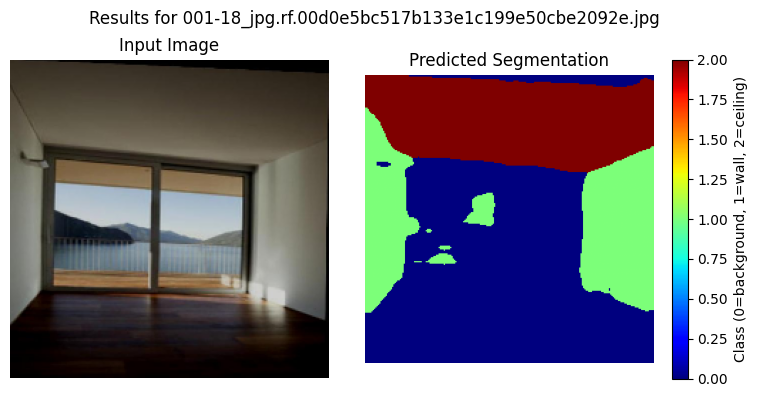

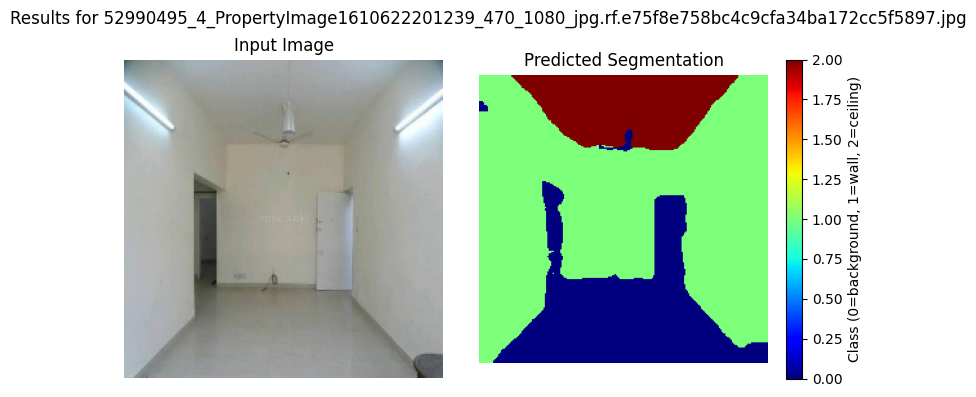

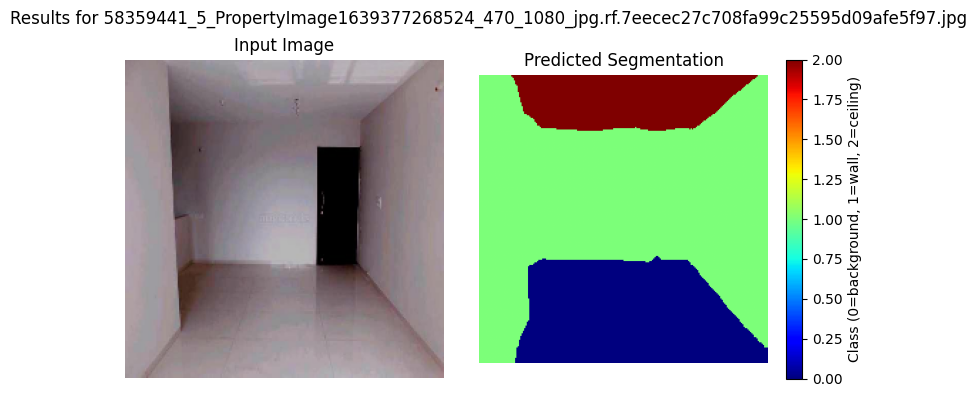

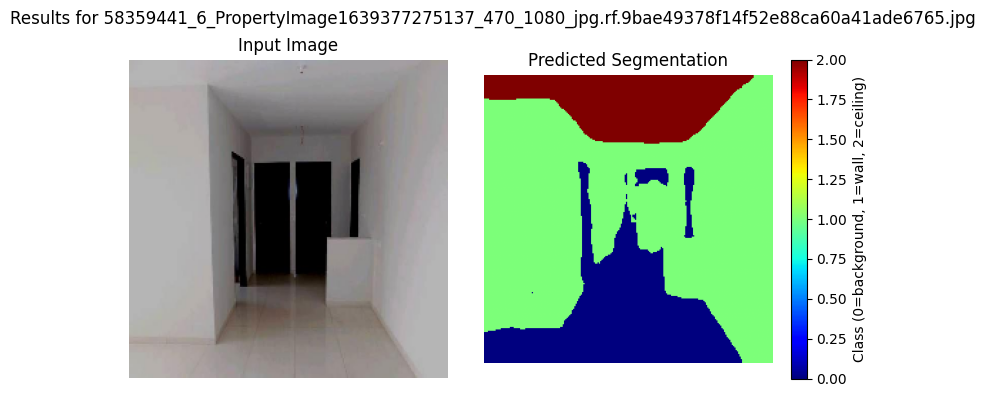

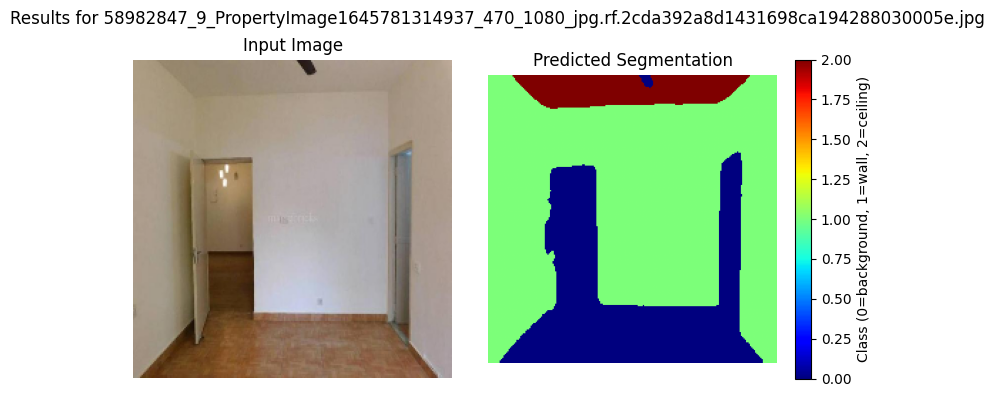

...

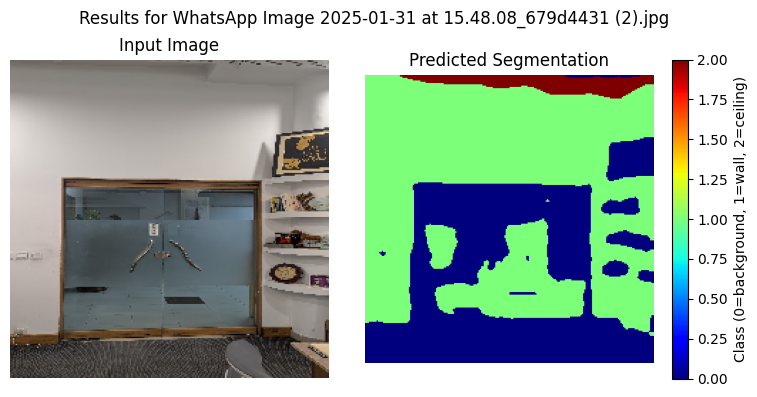

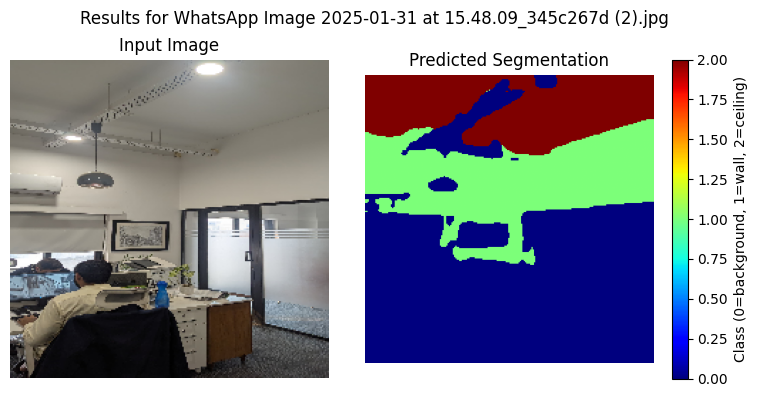

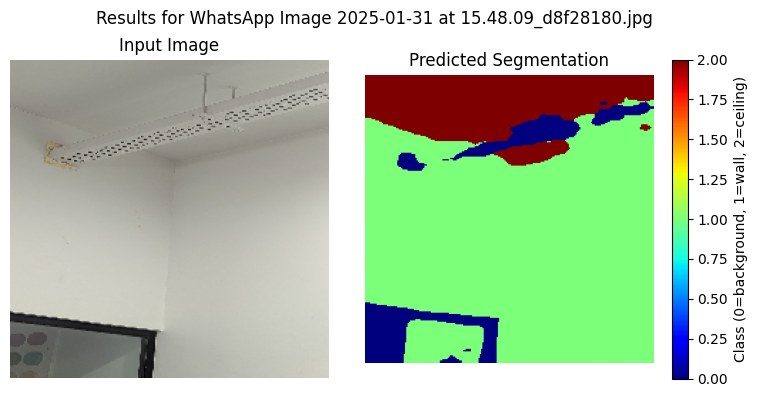

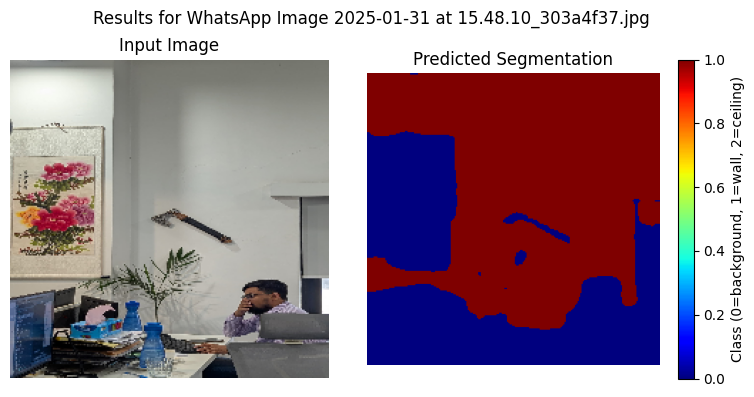

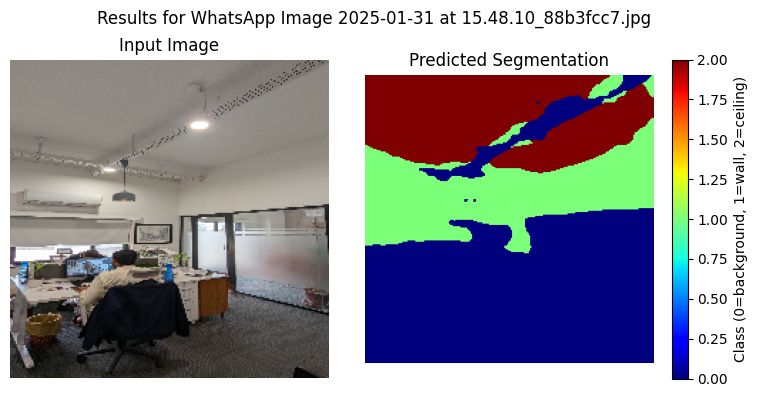

In [28]:
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
import os

# Load the TFLite model and allocate tensors
interpreter = tf.lite.Interpreter(model_path='Final_Wall_Segmentation.tflite')
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Check input/output shapes
print("Input shape expected:", input_details[0]['shape'])  # Should be [1, 224, 224, 3]
print("Output shape expected:", output_details[0]['shape'])  # Should be [1, 224, 224, 3]
print("Input dtype:", input_details[0]['dtype'])  # Should be uint8
print("Output dtype:", output_details[0]['dtype'])  # Should be uint8

# Define the image directory
image_folder = 'E:\\Wall_Segmentation_project\\testing images'

# Get list of image files
image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
print(f"Found {len(image_files)} images to test in {image_folder}")

# Process each image
for img_file in image_files:
    # Load and preprocess the test image
    test_image_path = os.path.join(image_folder, img_file)
    image = cv2.imread(test_image_path)

    # Check if image loaded successfully
    if image is None:
        print(f"Error: Could not load image from {test_image_path}. Skipping.")
        continue

    # Preprocess the image
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    image = cv2.resize(image, (224, 224))  # Changed: Resize to 224x224
    input_data = np.expand_dims(image, axis=0).astype(np.uint8)  # Changed: uint8, no normalization

    # Set input tensor
    interpreter.set_tensor(input_details[0]['index'], input_data)

    # Run inference
    interpreter.invoke()

    # Get output tensor
    output_data = interpreter.get_tensor(output_details[0]['index'])  # Shape: [1, 224, 224, 3], uint8
    prediction = np.argmax(output_data[0], axis=-1)  # Convert to class indices: [224, 224]

    # Visualize the result
    plt.figure(figsize=(8, 4))  # Adjusted size for 224x224

    # Original image
    plt.subplot(1, 2, 1)
    plt.title("Input Image")
    plt.imshow(image)
    plt.axis('off')

    # Predicted segmentation mask
    plt.subplot(1, 2, 2)
    plt.title("Predicted Segmentation")
    plt.imshow(prediction, cmap='jet')
    plt.colorbar(label='Class (0=background, 1=wall, 2=ceiling)')
    plt.axis('off')

    plt.suptitle(f"Results for {img_file}")
    plt.tight_layout()
    plt.show()